<font size = "5"> **[Image Tools](2_Image_Tools.ipynb)** </font>

<hr style="height:2px;border-top:4px solid #FF8200" />


# Registration of a Stack of Images 

[<img src=https://www.coeuscreativegroup.com/wp-content/uploads/2020/04/download-button.png, width=125>](https://raw.githubusercontent.com/pycroscopy/pyTEMlib/main/notebooks/Imaging/Structure_Analysis.ipynb) 

[![OpenInColab](https://colab.research.google.com/assets/colab-badge.svg)](
    https://colab.research.google.com/github/pycroscopy/pyTEMlib/blob/main/notebooks/Imaging/Structure_Analysis.ipynb)

by 

Gerd Duscher

Materials Science & Engineering<br>
Joint Institute of Advanced Materials<br>
The University of Tennessee, Knoxville

We us this notebook **only** for a stack of images.


## Install pyTEMlib

If you have not done so in the [Introduction Notebook](1_Correcting_Image_Distortions.ipynb), please install [pyTEMlib](https://github.com/gduscher/pyTEMlib) with the code cell below.

In [3]:
import sys
import importlib.metadata
def test_package(package_name):
    """Test if package exists and returns version or -1"""
    try:
        version = importlib.metadata.version(package_name)
    except importlib.metadata.PackageNotFoundError:
        version = '-1'
    return version

if test_package('pyTEMlib') < '0.2025.2.0':
    print('installing pyTEMlib')
    !{sys.executable} -m pip install  --upgrade pyTEMlib -q
print('done')


  Using cached pyTEMlib-0.2020.4.2-py3-none-any.whl (527 kB)
  Using cached scikit_learn-0.23.1-cp38-cp38-manylinux1_x86_64.whl (6.7 MB)
  Using cached ase-3.19.1-py3-none-any.whl (2.1 MB)
Processing /home/nyd/.cache/pip/wheels/78/09/f6/8b29ca28a25e5eb78ab732174e1e860f0ba9bf4ef8080c936c/pyUSID-0.0.8.1-py2.py3-none-any.whl
  Using cached threadpoolctl-2.1.0-py3-none-any.whl (12 kB)


## Import the usual libraries


You'll need at least pyTEMlib version 0.2020.04.2

You can load that library with the code cell above:

In [1]:
# import matplotlib and numpy
#                       use "inline" instead of "notebook" for non-interactive
#                       use widget for jupyterlab needs ipympl to be installed
# import matplotlib and numpy
%matplotlib widget  
import matplotlib.pylab as plt
import numpy as np

import sys
if 'google.colab' in sys.modules:
    from google.colab import output
    output.enable_custom_widget_manager()
    from google.colab import drive


%load_ext autoreload
%autoreload 2    
sys.path.insert(0, '../sidpy')
import sidpy
sys.path.insert(0, '../pyTEMlib')
import pyTEMlib

import pyTEMlib.file_tools      # File input/ output library
import pyTEMlib.image_tools 
import pyTEMlib.probe_tools
import pyTEMlib.atom_tools
import pyTEMlib.graph_tools

# For archiving reasons it is a good idea to print the version numbers out at this point
print('pyTEM version: ', pyTEMlib.__version__)
if 'google.colab' in sys.modules:
    drive.mount("/content/drive")
## Do all of registration

notebook_tags= {'notebook': 'Structure Analysis',
                'notebook_version': '2025_03_16',
                'pyTEM version': pyTEMlib.__version__}
sidpy.__version__

You don't have igor2 installed.     If you wish to open igor files, you will need to install it     (pip install igor2) before attempting.
You don't have gwyfile installed.     If you wish to open .gwy files, you will need to      install it (pip install gwyfile) before attempting.
Symmetry functions of spglib enabled
pyTEM version:  0.2025.02.2


'0.12.7'

## Load an image stack :

Please, load an image stack. <br>

A stack of images is used to reduce noise, but for an added image the images have to be aligned to compensate for drift and other microscope instabilities.

You select here (with the ``Select Main`` button,) a file of your image.

Note that the **Add** should only used for reference data

In [2]:
fileWidget = sidpy.FileWidget()


In [4]:
fileWidget.file_name
datasets = pyTEMlib.file_tools.open_file(fileWidget.file_name)
selector = sidpy.ChooseDataset(datasets)

Dropdown(description='select dataset:', options=('Channel_000: 20-3D Stack_10',), value='Channel_000: 20-3D St…

1.0

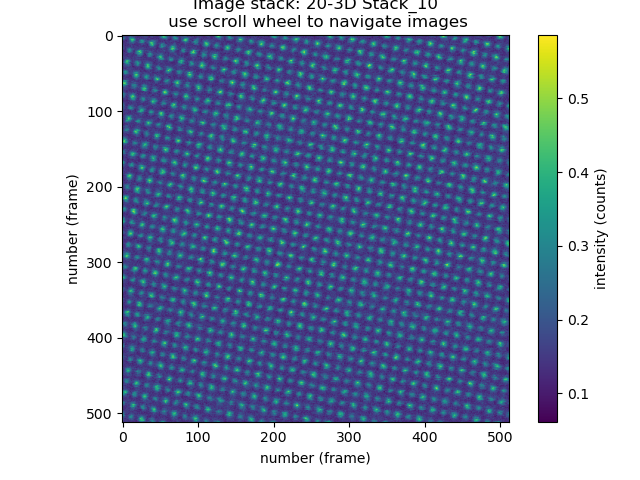

In [5]:
dataset = selector.dataset
dataset.data_type = 'IMAGE_STACK'
dataset.x.dimension_type = 'SPATIAL'
dataset.y.dimension_type = 'SPATIAL'

view = dataset.plot()
dataset.x.slope


Some of the metadata is available in the ``metadata`` attribute of the dataset but all information can be found in ``original metadata``.

## Complete Registration 

Takes a while, depending on your computer between 1 and 10 minutes

### Rigid Registration

Using sub-pixel accuracy registration determination method of:

Manuel Guizar-Sicairos, Samuel T. Thurman, and James R. Fienup, “Efficient subpixel image registration algorithms,” Optics Letters 33, 156-158 (2008). [DOI:10.1364/OL.33.000156](https://www.doi.org/%2010.1364/OL.33.000156)

as implemented in ``phase_cross_correlation`` function by ``scikit-image`` in the [registration](https://scikit-image.org/docs/dev/api/skimage.registration.html) package. 

### Non-Rigid Registration

Here we use the **Diffeomorphic Demon Non-Rigid Registration** as provided by **simpleITK**.  

Please Cite: 
* [simpleITK](http://www.simpleitk.org/SimpleITK/project/parti.html)
    
    and
    
* [T. Vercauteren, X. Pennec, A. Perchant and N. Ayache *Diffeomorphic Demons Using ITK\'s Finite Difference Solver Hierarchy* The Insight Journal, 2007](http://hdl.handle.net/1926/510)

Stack contains  25  images, each with 512  pixels in x-direction and  512  pixels in y-direction


  0%|          | 0/25 [00:00<?, ?it/s]

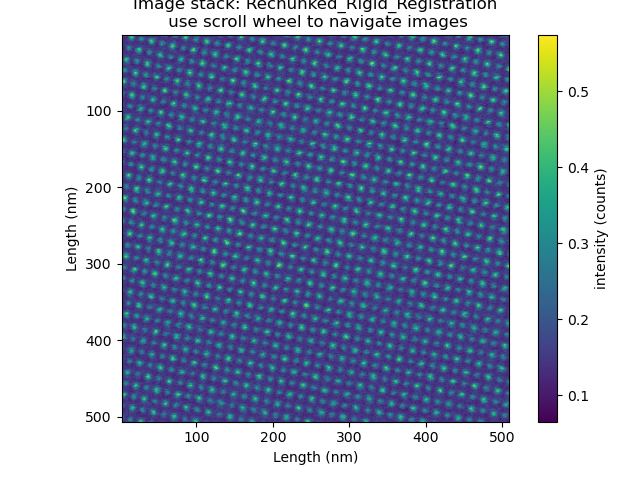

In [6]:
rigid_registered= pyTEMlib.image_tools.rigid_registration(dataset)
datasets['rigid_registered'] = rigid_registeredrigid_registered
view = rigid_registered.plot()

  0%|          | 0/25 [00:00<?, ?it/s]

:-)
You have successfully completed Diffeomorphic Demons Registration


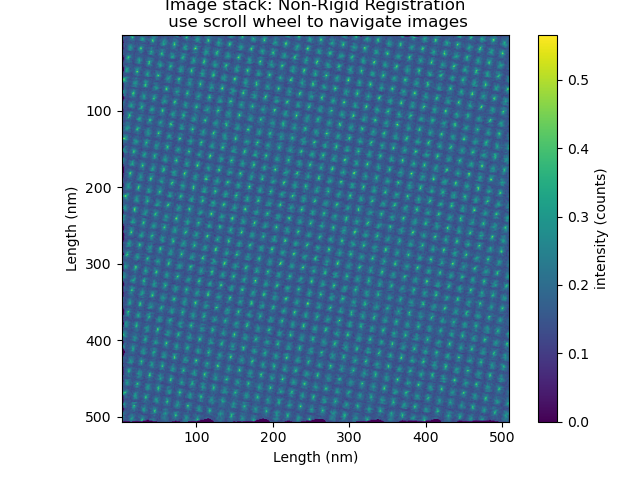

In [7]:
demon_registered = pyTEMlib.image_tools.demon_registration(rigid_registered)
datasets['demon_registered'] = demon_registered
view2 = demon_registered.plot()

Or do it all together

In [ ]:
import importlib
importlib.reload(pyTEMlib.image_tools)

demon_registered, rigid_registered = pyTEMlib.image_tools.complete_registration(dataset)
demon_registered.data_type = 'image_stack'
view2 = demon_registered.plot()

You will need to zoom in to see that the images are changing.

Compare this to the rigid registered stack

In [ ]:
Save these datasets


In [18]:
pyTEMlib.file_tools.save(FileWidget.filename{:-3] +'hdf5')


'C:\\Users\\gduscher\\Downloads\\0047 - 20250226 4.30 Mx STEM HAADF Diffraction 23.2 nm.'

### Check Drift

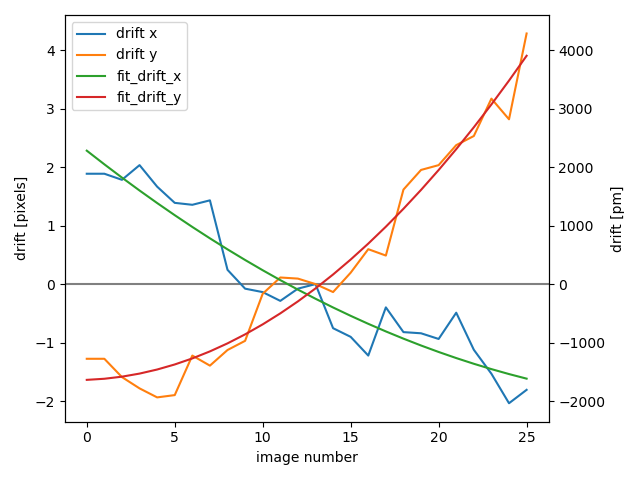

In [8]:
drift = rigid_registered.metadata['drift']
polynom_degree = 2 # 1 is linear fit, 2 is parabolic fit, ...

x = np.linspace(0,drift.shape[0]-1,drift.shape[0])

line_fit_x = np.polyfit(x, drift[:,0], polynom_degree)
poly_x = np.poly1d(line_fit_x)
line_fit_y = np.polyfit(x, drift[:,1], polynom_degree)
poly_y = np.poly1d(line_fit_y)

plt.figure()
plt.axhline(color = 'gray')
plt.plot(x, drift[:,0], label = 'drift x')
plt.plot(x, drift[:,1], label = 'drift y')
plt.plot(x, poly_x(x),  label = 'fit_drift_x')
plt.plot(x, poly_y(x),  label = 'fit_drift_y')

plt.legend();
ax_pixels = plt.gca()
ax_pixels.step(1, 1)

scaleX = 1000 #(rigid_registered.x[1]-rigid_registered.x[0])*1000.  #in pm

ax_pm = ax_pixels.twinx()
x_1, x_2 = ax_pixels.get_ylim()

ax_pm.set_ylim(x_1*scaleX, x_2*scaleX)

ax_pixels.set_ylabel('drift [pixels]')
ax_pm.set_ylabel('drift [pm]')
ax_pixels.set_xlabel('image number');
plt.tight_layout()


## Find Atom Positions
### Lucy -Richardson Deconvolution

Lucy - Richardson Deconvolution removes noise and convolutes the intensity back into the atom (columns).

Here we use a slightly modified Lucy - Richardson Deconvolution which stops when converged.

Ideally the atom_size should be as large as the atoms in the image.

A good Lucy-Richardson Deconvolution should result in an image with atoms of a radius of about 2 pixels.

The number of steps to convergence should be less than 300 for a good approximation of atom_size.
> we use the non-rigid registered datset


0.06
smal
3 3
Deconvolution of  20-3D Stack_10


  0%|          | 0/500 [00:00<?, ?it/s]

converged in 57 iterations

 Lucy-Richardson deconvolution converged in 57  iterations


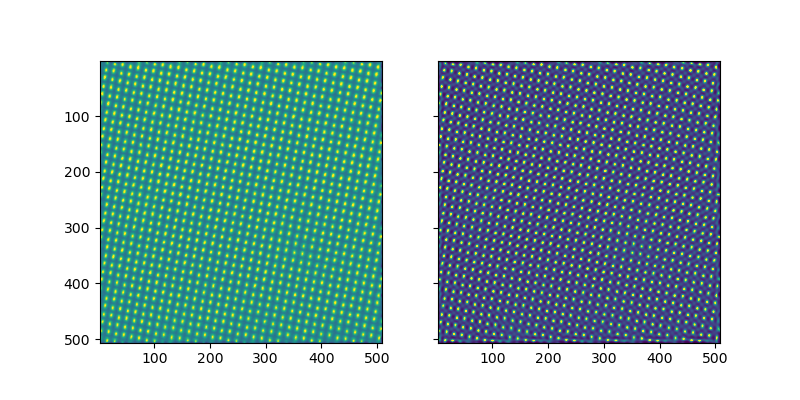

In [12]:
# ------- Input ------
atoms_size = .06 # in nm
# --------------------

image = demon_registered.sum(axis=0)
# image = dataset.sum(axis=0)

out_tags = {}
image.metadata['experiment']= {'convergence_angle': 30, 'acceleration_voltage': 200000.}

scale_x = 1 #image.x[1] - image.x[0]
gauss_diameter = atoms_size/scale_x
print(gauss_diameter)
if gauss_diameter < 3:
    print('smal')
    gauss_diameter = 3
print(gauss_diameter, gauss_diameter*scale_x)
gauss_probe = pyTEMlib.probe_tools.make_gauss(image.shape[0], image.shape[1], gauss_diameter)

print('Deconvolution of ', dataset.title)
LR_dataset = pyTEMlib.image_tools.decon_lr(image, gauss_probe, verbose=False)

extent = LR_dataset.get_extent([0,1])
fig, ax = plt.subplots(1, 2, figsize=(8, 4), sharex=True, sharey=True)
ax[0].imshow(image.T, extent = extent,vmax=np.median(np.array(image))+3*np.std(np.array(image)))
ax[1].imshow(LR_dataset.T, extent = extent, vmax=np.median(np.array(LR_dataset))+3*np.std(np.array(LR_dataset)));

datasets['lr_decon'] = LR_dataset

#### Log Deconvolution

In [89]:
LR_dataset.metadata.update({'analysis': {'Lucy_Richardson': {
                        'notebook': 'Image_Registration' ,
                        # 'notebook_version': __notebook_version__,
                        'input': dataset.title,
                        'probe_diameter': gauss_diameter,
                        'kind_of_probe': 'Gauss',
                        'probe_width': atoms_size
                        }}})
LR_dataset.metadata

{'analysis': {'Lucy_Richardson': {'notebook': 'Image_Registration',
   'input': '20-3D Stack_10',
   'probe_diameter': 3,
   'kind_of_probe': 'Gauss',
   'probe_width': 0.06}},
 'experiment': {'convergence_angle': 30,
  'acceleration_voltage': 200000.0,
  'wavelength': 0.0025079340436272276},
 'input_crop': [3, 509, 2, 507],
 'input_shape': (512, 25),
 'input_dataset': '20-3D Stack_10'}

### Atom Detectionnwith Blob-Finder

Choose threshold and atom size so that all atoms or at least all bright atoms of an unit cell are found 

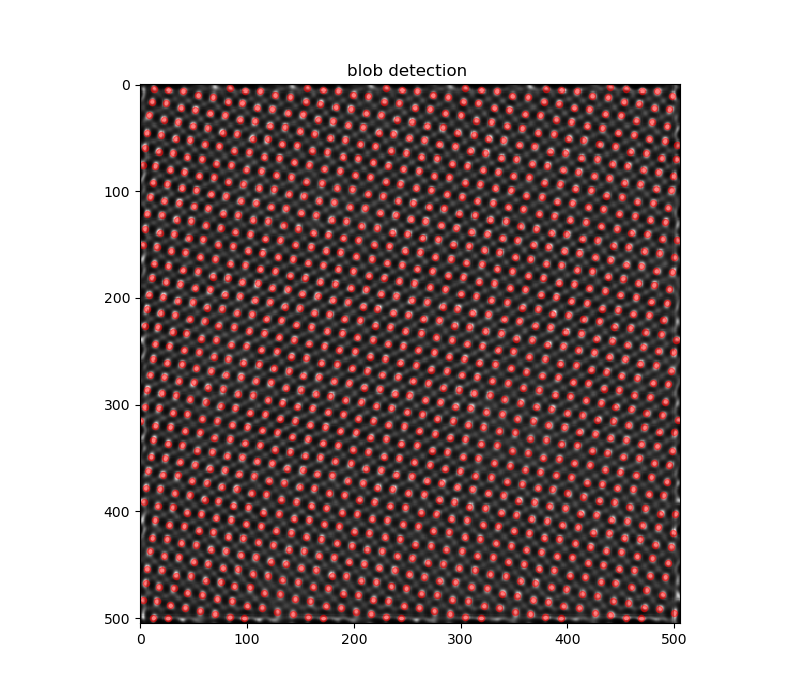

In [17]:
import skimage
# ------- Input ------
threshold = 20.7 #usally between 0.01 and 0.9  the smaller the more atoms
atom_size = .05 #in nm  
# ----------------------


image = LR_dataset
#image = image_choice.dataset
# scale_x = pyTEMlib.file_tools.get_slope(image.dim_1)
blobs =  skimage.feature.blob_log(image, max_sigma=atom_size/scale_x, threshold=threshold)

fig1, ax = plt.subplots(1, 1,figsize=(8,7), sharex=True, sharey=True)
plt.title("blob detection ")

plt.imshow(image.T, interpolation='nearest',cmap='gray', vmax=np.median(np.array(image))+3*np.std(np.array(image)))
plt.scatter(blobs[:, 0], blobs[:, 1], c='r', s=20, alpha = .5);

#### Log Atom Positions

In [94]:
out_tags  =  {}
out_tags['analysis']= 'Atom Positions'
# out_tags['notebook']= __notebook__ 
# out_tags['notebook_version']= __notebook_version__

out_tags['atoms'] = blobs
out_tags['atom_size'] = atom_size #in nm gives the size of the atoms or resolution
out_tags['threshold'] =  threshold  #between 0.01 and 0.1 
out_tags['pixel_size'] = scale_x


out_tags['name'] = 'Atom finding'
out_tags['title'] = out_tags['name']
tags = {'atom_pixel':  out_tags}
if isinstance(image.metadata['analysis'], str):
    image.metadata['analysis']={image.metadata['analysis']:{}}

image.metadata['analysis'].update(tags)

image.metadata['analysis']

{'non-rigid demon registration': {},
 'atom_pixel': {'analysis': 'Atom Positions',
  'atoms': array([[6.0000000e+00, 4.5000000e+01, 5.0000001e-02],
         [6.0000000e+00, 1.2100000e+02, 5.0000001e-02],
         [4.9800000e+02, 1.1000000e+01, 5.0000001e-02],
         ...,
         [5.0300000e+02, 1.4600000e+02, 5.0000001e-02],
         [4.4000000e+02, 2.0000000e+00, 1.5555555e-01],
         [5.0300000e+02, 5.7000000e+01, 5.0000001e-02]], dtype=float32),
  'atom_size': 0.05,
  'threshold': 20.7,
  'pixel_size': 1,
  'name': 'Atom finding',
  'title': 'Atom finding'}}

### Refine All Atom Positions
Fitting of a Gaussian into the center of an atom

There will be convergence errors if the atom_radius value is too large or too small

In [22]:
image_choice = sidpy.ChooseDataset(datasets)  

Dropdown(description='select dataset:', options=('Channel_000: 20-3D Stack_10', 'rigid_registered: Rechunked_R…

sidpy.Dataset of type IMAGE_STACK with:
 dask.array<sub, shape=(506, 505), dtype=float64, chunksize=(506, 505), chunktype=numpy.ndarray>
 data contains: intensity (counts)
 and Dimensions: 
x:  Length (nm) of size (506,)
y:  Length (nm) of size (505,)
 with metadata: ['analysis', 'experiment', 'input_crop', 'input_shape', 'input_dataset']
using radius  3 pixels


  0%|          | 0/1183 [00:00<?, ?it/s]

C:\Users\gduscher\OneDrive - University of Tennessee\GitHub\Image_Distortion\../pyTEMlib\pyTEMlib\probe_tools.py:17: RuntimeWarning: invalid value encountered in divide
  probe = g / g.sum() * intensity


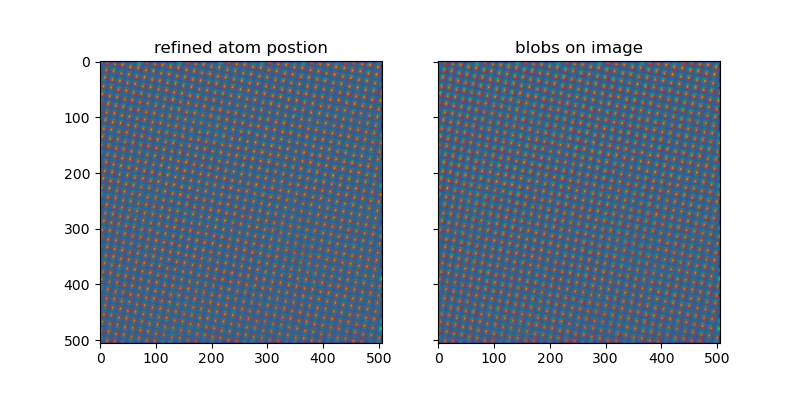

In [79]:
# ------- Input ------
atom_radius = 3  # in pixel
# ----------------------

if image_choice.dataset.data_type.name == 'IMAGE_STACK':
    image = image_choice.dataset.sum(axis=0)
else:
    image = image_choice.dataset

#atoms = atom_group['atoms'][()]
atoms = blobs
image = image-image.min()
print(image)

#atom_radius = 2
MaxInt = 0
MinInt = 0 
maxDist = 2
sym = pyTEMlib.atom_tools.atom_refine(np.array(image), atoms, atom_radius, max_int = 0, min_int = 0, max_dist = 2)
refined_atoms = np.array(sym['atoms'])

fig, ax = plt.subplots(1, 2, figsize=(8, 4), sharex=True, sharey=True)
ax[0].imshow(image.T)
ax[0].scatter(refined_atoms[:,0],refined_atoms[:,1],  s=10, alpha = 0.3, color = 'red')
ax[0].set_title('refined atom postion')
ax[1].imshow(image.T)
ax[1].scatter(atoms[:, 0], atoms[:, 1], c='r', s=10, alpha = .3);
ax[1].set_title('blobs on image');

#### Log Refined Atom Positions

In [ ]:
out_tags  =  {}
out_tags['analysis']= 'Atom Positions'
# out_tags['notebook']= __notebook__ 
# out_tags['notebook_version']= __notebook_version__

out_tags['atoms'] = blobs
out_tags['atom_size'] = atom_size #in nm gives the size of the atoms or resolution
out_tags['threshold'] =  threshold  #between 0.01 and 0.1 
out_tags['pixel_size'] = scale_x


out_tags['name'] = 'Atom finding'
out_tags['title'] = out_tags['name']
tags = {'atom_pixel':  out_tags}
if isinstance(image.metadata['analysis'], str):
    image.metadata['analysis']={image.metadata['analysis']:{}}

image.metadata['analysis'].update(tags)

image.metadata['analysis']

## Analyse Atom Position
### Find angles of all unit cells

CPU times: total: 1.48 s
Wall time: 1.59 s


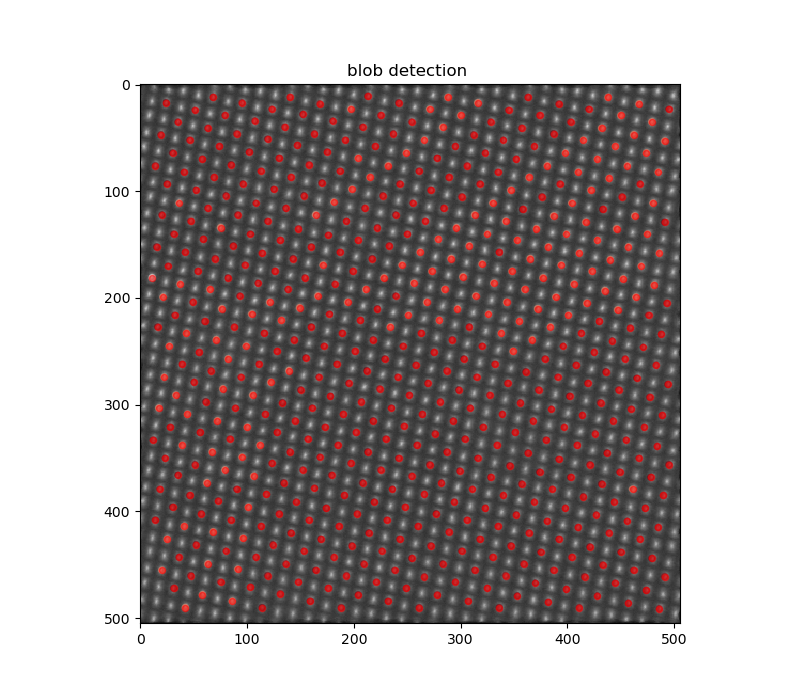

In [23]:
import scipy
import pyTEMlib.graph_tools
def breath_first(graph, initial, lattice_parameter, tolerance=1):
    
    neighbour_tree = scipy.spatial.KDTree(graph)
    distances, indices = neighbour_tree.query(graph,  # let's get all neighbours
                                              k=50)  # projection_tags['number_of_nearest_neighbours']*2 + 1)
    visited = []  # the atoms we visited
    angles = []  # atoms at ideal lattice
    sub_lattice = []
    sub_lattice = []  # atoms in base and disregarded
    queue = [initial]
    queue_angles=[0]
    
    while queue:
        node = queue.pop(0)
        angle = queue_angles.pop(0)
        
        if node not in visited and node not in sub_lattice:
            visited.append(node)
            angles.append(angle)
            neighbors = indices[node]
            for i, neighbour in enumerate(neighbors):
                if neighbour not in visited:
                    hopp = graph[node] - graph[neighbour]
                    distance_to_ideal = np.linalg.norm(hopp)
                    if distance_to_ideal < lattice_parameter - tolerance*5:
                        sub_lattice.append(neighbour) 
                    elif np.min(np.abs(distance_to_ideal- lattice_parameter)) < tolerance:
                        queue.append(neighbour) 
                        queue_angles.append(np.arctan2(hopp[1], hopp[0]))
    angles[0] = angles[1]
    out_atoms = np.stack([graph[visited][:, 0], graph[visited][:, 1], angles])
    return out_atoms.T, visited

def delete_rim_atoms(atoms, extent, rim_distance):
    rim = np.where(atoms[:, :2] - extent > -rim_distance)[0]
    middle_atoms = np.delete(atoms, rim, axis=0)
    rim = np.where(middle_atoms[:, :2].min(axis=1)<rim_distance)[0]
    middle_atoms = np.delete(middle_atoms, rim, axis=0)
    return middle_atoms
init = 633
#init = 6328
#init= 6589

%time hopped_atoms, indices = breath_first(blobs, init, 22, 2)
middle_atoms = pyTEMlib.graph_tools.delete_rim_atoms(hopped_atoms, image.shape, 10)

plt.close('all')
fig1, ax = plt.subplots(1, 1,figsize=(8,7), sharex=True, sharey=True)
plt.title("blob detection ")

plt.imshow(demon_registered.sum(axis=0).T, interpolation='nearest',cmap='gray', vmax=np.median(np.array(image))+3*np.std(np.array(image)))
plt.scatter(middle_atoms[:, 0], middle_atoms[:, 1], c=np.degrees(np.degrees(middle_atoms[:, 2])% 60), cmap = 'Reds', s=20, alpha = .5);
plt.scatter(middle_atoms[:, 0], middle_atoms[:, 1], c='red', s=20, alpha = .5);
#plt.scatter(blobs[init][0], blobs[init][1], c='orange')
angles = np.degrees(middle_atoms[:, 2])% 60


### Define Crystal and Zone-Axis

In [141]:
crystal_name = 'Au'
crystal = pyTEMlib.crystal_tools.structure_by_name(crystal_name)
print(crystal_name)
crystal

crystal.cell.lengths()[0]/image.x.slope/10
crystal.info = {'experimental': {'zone_axis': [1, 1, 1], 'angle': 0}}
layer = pyTEMlib.crystal_tools.get_projection(crystal)
gamma =  layer.cell.angles()[2]
layer.cell.lengths() , layer.cell.lengths()/image.x.slope/10 , layer.cell.angles(), np.linalg.norm(layer.positions[:,:2], axis=1), layer.get_scaled_positions()

Au
projected atomic numbers


(array([5.76744575e+00, 5.76744575e+00, 1.11022302e-16]),
 array([3.60179102e+01, 3.60179102e+01, 6.93338351e-16]),
 array([90., 90., 60.]),
 array([0.        , 2.88372288, 2.88372288, 4.99475453]),
 array([[ 0.00000000e+00,  0.00000000e+00, -1.16901319e-02],
        [ 0.00000000e+00,  5.00000000e-01,  5.00000000e-01],
        [ 5.00000000e-01,  1.08088567e-17,  5.00000000e-01],
        [ 5.00000000e-01,  5.00000000e-01,  1.01169013e+00]]))

In [80]:
crystal_name = 'SrTiO3'
crystal = pyTEMlib.crystal_tools.structure_by_name(crystal_name)
print(crystal_name)
crystal

crystal.cell.lengths()[0]/image.x.slope/10
crystal.info = {'experimental': {'zone_axis': [0, 0, 1], 'angle': 0}}
layer = pyTEMlib.crystal_tools.get_projection(crystal)
print(layer.cell.angles())
gamma =  layer.cell.angles()[2]
layer.cell.lengths() , layer.cell.lengths()/image.x.slope/10 , layer.cell.angles(), np.linalg.norm(layer.positions[:,:2], axis=1), layer.get_scaled_positions()

SrTiO3
projected atomic numbers
[90. 90. 90.]


(array([3.905268, 3.905268, 1.952634]),
 array([0.3905268, 0.3905268, 0.1952634]),
 array([90., 90., 90.]),
 array([0.        , 2.76144149, 2.76144149, 1.952634  , 1.952634  ]),
 array([[0. , 0. , 0. ],
        [0.5, 0.5, 1. ],
        [0.5, 0.5, 0. ],
        [0. , 0.5, 1. ],
        [0.5, 0. , 1. ]]))

### Analyse Angles of Unit Cells

1183
 Average unit cell angle 56.2 with standard deviation 1.55; from 50.9 to 60.9


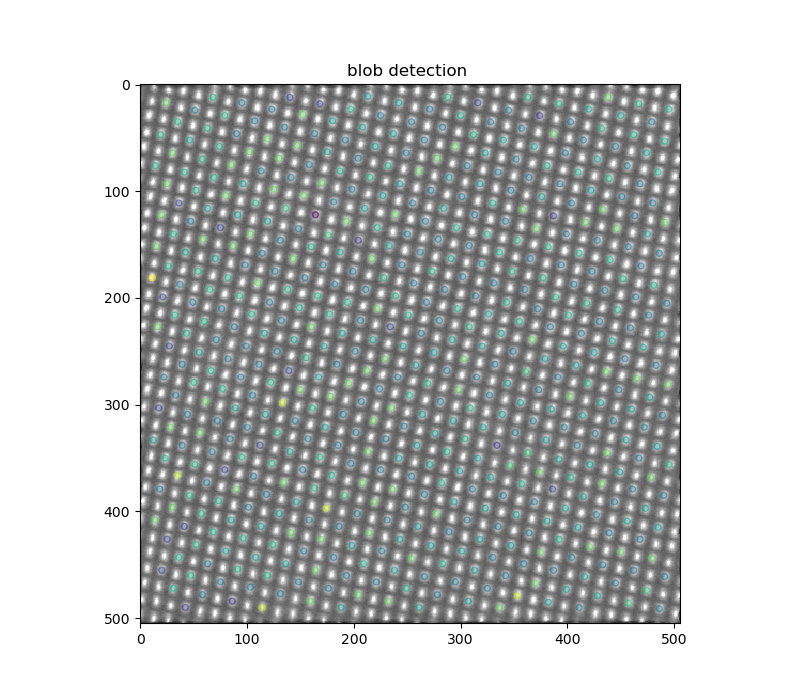

In [81]:
print(len(blobs))
fig1, ax = plt.subplots(1, 1,figsize=(8,7), sharex=True, sharey=True)
plt.title("blob detection ")

plt.imshow(image.T, interpolation='nearest',cmap='gray', vmax=np.median(np.array(image))+3*np.std(np.array(image)))
plt.scatter(middle_atoms[:, 0], middle_atoms[:, 1], c=np.degrees(np.degrees(middle_atoms[:, 2])% gamma), cmap = 'viridis', s=20, alpha = .5);
angles = np.degrees(middle_atoms[:, 2])% gamma

print(f' Average unit cell angle {np.average(angles):.1f} with standard deviation {np.std(angles):.2f}; from {np.min(angles):.1f} to {np.max(angles):.1f}')

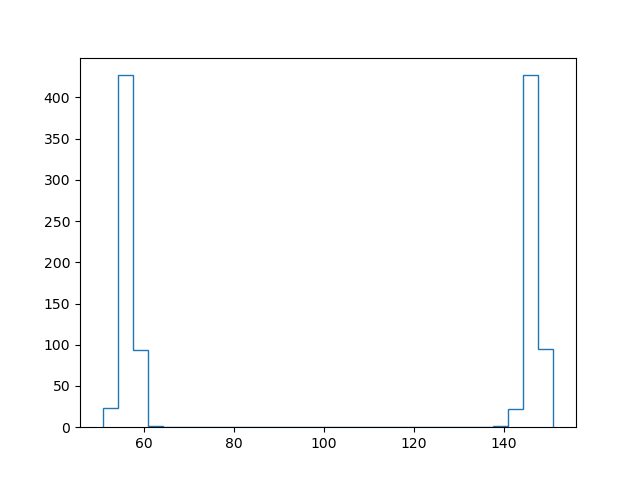

In [82]:
plt.figure()
plot_angles = np.append(angles, angles+gamma)
plot_angles[plot_angles<0] +=gamma 
counts, bins = np.histogram(plot_angles, bins = 30)
plt.stairs(counts, bins)

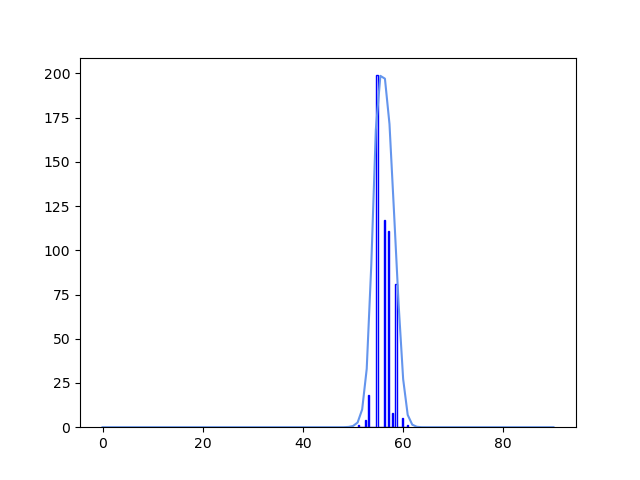

In [83]:

from sklearn.neighbors import KernelDensity
a = angles.reshape(-1,1)

kde = KernelDensity(kernel='gaussian', bandwidth=3).fit(a)

kde.score_samples(a)

X_plot = np.linspace(0, 90, 100)[:, np.newaxis] 

fig, ax = plt.subplots() 
  
  
# Calculating the density using the gaussian kernel with bandwidth 0.5 
kde = KernelDensity(kernel='gaussian', bandwidth=1).fit(a) 
  
# Calculating the log of the probability density function 
log_dens = kde.score_samples(X_plot) 
  
# Plotting the density curve 
ax.plot( 
    X_plot[:, 0], 
    np.exp(log_dens)*1000, 
    color="cornflowerblue", 
    linestyle="-", 
    label="Gaussian kernel density"
) 
counts, bins = np.histogram(angles, bins = 40)
ax.stairs(counts, bins, color='blue')
  


### Rigid Ange Graph Hopping  

924


0.95613337

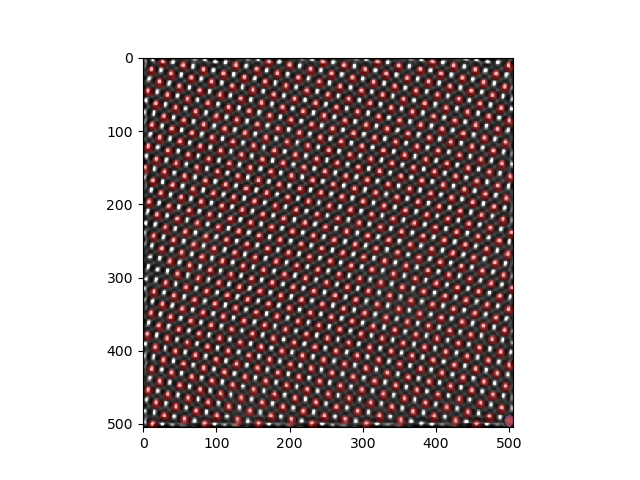

In [54]:
one_grain_indices = np.where(angles > 44)
one_grain = middle_atoms[one_grain_indices]
one_grain_angle = np.median(one_grain[:, 2]%np.radians(60))

two_grain_indices = np.where(angles < 44)
two_grain = middle_atoms[two_grain_indices]
two_grain_angle = np.median(two_grain[:, 2]%np.radians(60))

gamma = np.radians(layer.cell.angles()[2])

one_grain[100]
plt.figure()
plt.imshow(image.T, interpolation='nearest',cmap='gray', vmax=np.median(np.array(image))+3*np.std(np.array(image)))
#plt.scatter(one_grain[:, 0], one_grain[:, 1], c='blue', alpha = 0.2)

init = np.argmin(np.linalg.norm(blobs[:,:2]- [674, 594], axis=1))
#init = np.argmin(np.linalg.norm(blobs[:,:2]- [610, 552], axis=1))

plt.scatter(blobs[init][0], blobs[init][1], c='orange')
projection_tags = {'lattice_vector': {'a': np.array([np.cos(one_grain_angle)*21, np.sin(one_grain_angle)*21]),
                                      'b': np.array([np.cos(one_grain_angle+gamma)*21, np.sin(one_grain_angle+gamma)*21]) },
                   'allowed_variation': 1.5,
                   'distance_unit_cell':  21*1.04}
layer.info['projection'] = projection_tags
hop1, ideal = pyTEMlib.graph_tools.breadth_first_search2(blobs[:,:2], init, layer)
projection_tags = {'lattice_vector': {'a': np.array([np.cos(two_grain_angle)*21, np.sin(two_grain_angle)*21]),
                                      'b': np.array([np.cos(two_grain_angle+gamma)*21, np.sin(two_grain_angle+gamma)*21]) },
                   'allowed_variation': 1.5,
                   'distance_unit_cell':  21*1.04}
layer.info['projection'] = projection_tags
#init = np.argmin(np.linalg.norm(blobs[:,:2]- [574, 520], axis=1))

print(init)
hop2, ideal = pyTEMlib.graph_tools.breadth_first_search2(blobs[:,:2], init, layer)

plt.scatter(hop1[:,0], hop1[:,1], c='red', alpha = 0.3)
plt.scatter(hop2[:,0], hop2[:,1], c='blue', alpha = 0.3)


one_grain_angle

(545, 3)


1.0460007

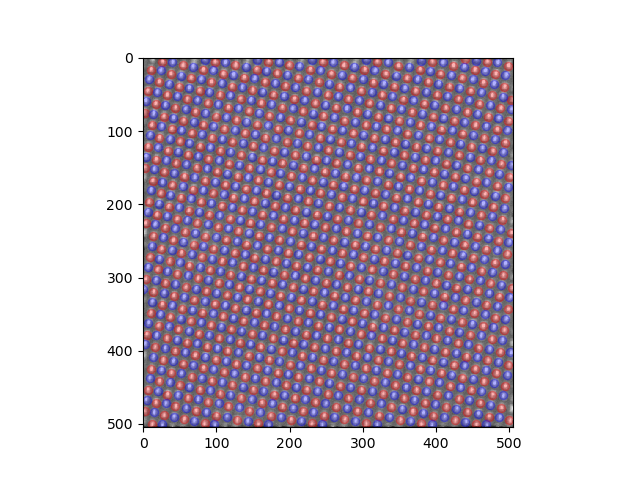

In [84]:
one_grain_indices = np.argmax(angles)
one_grain = middle_atoms # [one_grain_indices]
print(one_grain.shape)
one_grain_angle = np.max(one_grain[:, 2]%np.radians(60))


gamma = np.radians(layer.cell.angles()[2])
length = 22
plt.close('all')
plt.figure()
plt.imshow(image.T, interpolation='nearest',cmap='gray', vmax=np.median(np.array(image))+3*np.std(np.array(image)))
#plt.scatter(one_grain[:, 0], one_grain[:, 1], c='blue', alpha = 0.2)

init = np.argmin(np.linalg.norm(blobs[:,:2]- [812, 199], axis=1))

#init = np.argmin(np.linalg.norm(blobs[:,:2]- [610, 552], axis=1))
# init = 102
#plt.scatter(blobs[init][0], blobs[init][1], c='orange')
projection_tags = {'lattice_vector': {'a': np.array([np.cos(one_grain_angle)*length, np.sin(one_grain_angle)*length]),
                                      'b': np.array([np.cos(one_grain_angle+gamma)*length, np.sin(one_grain_angle+gamma)*length]) },
                   'allowed_variation': 5,
                   'distance_unit_cell':  length*1.04}
layer.info['projection'] = projection_tags
hop1, ideal = pyTEMlib.graph_tools.breadth_first_search2(blobs[:,:2], init, layer)
init = np.argmin(np.linalg.norm(blobs[:,:2]- [89, 989], axis=1))

hop2, ideal = pyTEMlib.graph_tools.breadth_first_search2(blobs[:,:2], init, layer)
plt.scatter(hop1[:,0], hop1[:,1], c='red', alpha = 0.3)
plt.scatter(hop2[:,0], hop2[:,1], c='blue', alpha = 0.3)


one_grain_angle

## Structure Anlysis

### Find all unit cells

In [85]:
import ase
positions = hopped_atoms.copy()
positions[:,2] = 0
atoms = ase.Atoms('Sr'*len(positions),
             positions=positions,
             cell=[image.shape[0],image.shape[1],0],
             pbc=[0, 0, 0])
atoms.info['bond_radii'] = [3] * len(positions)
graph_dictionary = pyTEMlib.graph_tools.find_polyhedra(atoms)

len(positions), len (graph_dictionary['cyclicity'])

extent [506. 505.   0.]
Find interstitials (finding centers for different elements takes a bit)


  0%|          | 0/1124 [00:00<?, ?it/s]

(575, 512)

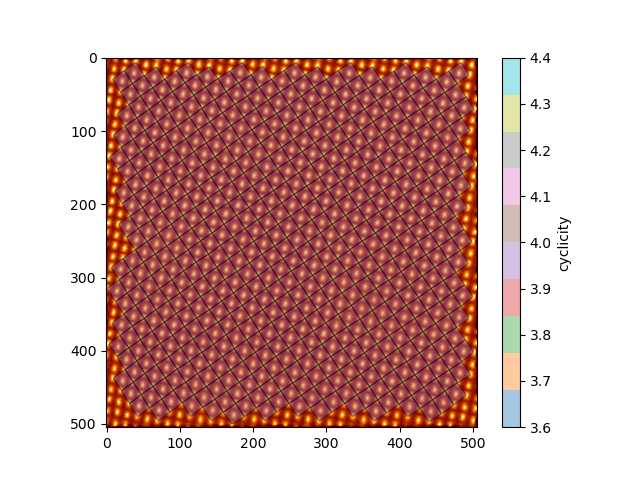

In [87]:
from matplotlib.collections import PatchCollection
from matplotlib import cm
import matplotlib
centers =  graph_dictionary['centers']
cyclicity = graph_dictionary['cyclicity']

unit_cells = PatchCollection(graph_dictionary['polygons'], alpha=0.4, cmap=matplotlib.cm.tab10)
plt.figure()
plt.imshow(image.T,  cmap = 'afmhot')

unit_cells.set_array(cyclicity)
unit_cells.set_edgecolor('black')
plt.gca().add_collection(unit_cells)
#plt.scatter(centers[:,0],centers[:,1],color='blue',alpha=0.5, s = 3)
#plt.scatter(hopped_atoms[:,0], hopped_atoms[:,1], c='red', alpha = 0.3)
cbar = plt.colorbar(unit_cells, label='cyclicity')

## Appendix

### Demon Registration

Here we use the **Diffeomorphic Demon Non-Rigid Registration** as provided by **simpleITK**.  

Please Cite: 
* [simpleITK](http://www.simpleitk.org/SimpleITK/project/parti.html)
    
    and
    
* [T. Vercauteren, X. Pennec, A. Perchant and N. Ayache *Diffeomorphic Demons Using ITK\'s Finite Difference Solver Hierarchy* The Insight Journal, 2007](http://hdl.handle.net/1926/510)

This Non-Rigid Registration consists of the following steps:

- determine ``reference`` image
    - For this we use the average of the rigid registered stack
    - this averaged stack is then smeared with a Gaussian of sigma 2 pixel to reduce noise
    - under the assumption that high frequency scan distortions cancel out over several images, we, therefore, obtained the center of mass of the atoms. 

- perform the ``demon registration`` filter to determine a distortion matrix
    - each single image of a stack is first smeared with a Gaussian of sigma of 2pixels
    - then the deformation matrix is determined for these images
    - the deformation matrix is a matrix where each pixel has a vector ( x, and y value) for the relative shift of this pixel.
    
- This deformation matrix is used to ``transform`` the image
	- The transformation is performed on the original image.
	- Important, here, is to set the interpolator method, (the image needs to be interpolated because the new pixels are not on an integer grid.)
    
    
Let's see what the different interpolators do.

|Method	| RMS contrast |	Standard |	Mean |
|-------|:--------------|:-------------|:-------|
|original   |0.1965806	|0.07764114	|0.3949583
|Linear	    |0.20159315	|0.079470366	|0.39421165
|BSpline	|0.20162606	|0.0794831 	|0.39421043
|Gaussian	|0.14310582	|0.056414302 	|0.39421389
|Hamming	|0.20163293	|0.07948672 	|0.39421496

The Gaussian interpolator as the only one seems to smear the signal.

We will use the ``Bspline`` method a fast and simple method that does not introduce spurious features and does not smear the signal.


#### Full Code of Demon registration 

In [ ]:
import simpleITK as sitk

def DemonReg(cube, verbose = False):
    """
    Diffeomorphic Demon Non-Rigid Registration 
    Usage:
    ------
    DemReg = DemonReg(cube, verbose = False)

    Input:
        cube: stack of image after rigid registration and cropping
    Output:
        DemReg: stack of images with non-rigid registration

    Dempends on:
        simpleITK and numpy
    
    Please Cite: http://www.simpleitk.org/SimpleITK/project/parti.html
    and T. Vercauteren, X. Pennec, A. Perchant and N. Ayache
    Diffeomorphic Demons Using ITK\'s Finite Difference Solver Hierarchy
    The Insight Journal, http://hdl.handle.net/1926/510 2007
    """
    
    DemReg =  np.zeros_like(cube)
    nimages = cube.shape[0]
    print(nimages)
    # create fixed image by summing over rigid registration

    fixed_np = np.average(current_dataset, axis=0)

    fixed = sitk.GetImageFromArray(fixed_np)
    fixed = sitk.DiscreteGaussian(fixed, 2.0)

    #demons = sitk.SymmetricForcesDemonsRegistrationFilter()
    demons = sitk.DiffeomorphicDemonsRegistrationFilter()

    demons.SetNumberOfIterations(200)
    demons.SetStandardDeviations(1.0)

    resampler = sitk.ResampleImageFilter()
    resampler.SetReferenceImage(fixed);
    resampler.SetInterpolator(sitk.sitkBspline)
    resampler.SetDefaultPixelValue(0)

    done = 0
        
    for i in range(nimages):
        if done < int((i+1)/nimages*50):
            done = int((i+1)/nimages*50)
            sys.stdout.write('\r')
            # progress output :
            sys.stdout.write("[%-50s] %d%%" % ('*'*done, 2*done))
            sys.stdout.flush()
        
        moving = sitk.GetImageFromArray(cube[i])
        movingf = sitk.DiscreteGaussian(moving, 2.0)
        displacementField = demons.Execute(fixed,movingf)
        outTx = sitk.DisplacementFieldTransform( displacementField )
        resampler.SetTransform(outTx)
        out = resampler.Execute(moving)
        DemReg[i,:,:] = sitk.GetArrayFromImage(out)
        #print('image ', i)
        
    
    print(':-)')
    print('You have succesfully completed Diffeomorphic Demons Registration')
    
    return DemReg
